## [SoundCTM: Unifying Score-based and Consistency Models for Full-band Text-to-Sound Generation](https://openreview.net/forum?id=KrK6zXbjfO)

<a href="https://openreview.net/forum?id=KrK6zXbjfO">Openreview</a> | <a href="https://huggingface.co/spaces/hkchengrex/MMAudio">GitHub</a> | <a href="https://huggingface.co/koichisaito/soundctm_dit/tree/main">Checkpoints</a> |

[Koichi Saito](https://scholar.google.com/citations?user=UT-g5BAAAAAJ), [Dongjun Kim](https://sites.google.com/view/dongjun-kim), [Takashi Shibuya](https://scholar.google.com/citations?user=XCRO260AAAAJ), [Chieh-Hsin Lai](https://chiehhsinjesselai.github.io/), [Zhi Zhong](https://scholar.google.com/citations?user=iRVT3A8AAAAJ), [Yuhta Takida](https://scholar.google.co.jp/citations?user=ahqdEYUAAAAJ), [Yuki Mitsufuji](https://www.yukimitsufuji.com/)

Sony AI, Stanford University, and Sony Group Corporation

## Make sure we are using GPU

In [64]:
!nvidia-smi
import torch
if torch.cuda.is_available():
  print('Using GPU')
  device = 'cuda'
else:
  print('CUDA not available. Please connect to a GPU instance if possible.')
  device = 'cpu'

Mon Mar 31 00:57:46 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.06             Driver Version: 535.183.06   CUDA Version: 12.5     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100 80GB PCIe          On  | 00000000:01:00.0 Off |                    0 |
| N/A   54C    P0              80W / 300W |  27619MiB / 81920MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

## Import libraries

In [65]:
import torchaudio
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from notebook_utils import parse_args, init_model, run_inference, save_waveforms
from pathlib import Path
from datetime import datetime

## Load pretrained models (models will be downloaded automatically)
We'll load pretrained SoundCTM-DiT. 
Checkpoints will be downloaded automatically under `ckpt/models` and `ckpt/utils` 


In [ ]:
variants = "ac_v2" # 'ac_v1_iclr' (Use last layer of CLAP text encoder), 'ac_v2' (Use second last layer of CLAP text encoder, i.e., same as SA)
custom_args = parse_args([
    "--variants", variants,
])
model_refs = init_model(custom_args)


GPU is available. Using GPU...
Using base URL: https://huggingface.co/koichisaito/soundctm_dit/resolve/main/
File already exists: ckpt/models/as_ac_v2_ema_0999_030000.pt
File already exists: ckpt/models/as_ac_v2_progress_state.pth
File already exists: ckpt/models/as_ac_v2_summary.jsonl
File already exists: ckpt/models/as_ac_v2_z_stats.pth
File already exists: ckpt/utils/630k-audioset-best.pt
File already exists: ckpt/utils/gaussiandac/weights.pth
------------------------------------------------------------------
Initialization config: {'variants': 'as_ac_v2', 'config': 'configs/hyperparameter_config/inference/dit_demo.yaml', 'prompt': 'bird charping near the ocean', 'cfg': 5.0, 'num_steps': 4, 'nu': 1.0, 'output_dir': PosixPath('output'), 'seed': 5031, 'sampler': 'deterministic', 'sampling_gamma': 0.0, 'test_file': 'data/test.csv', 'num_samples': 3, 'training_args': 'ckpt/models/as_ac_v2_summary.jsonl', 'model_ckpt_path': 'ckpt/models/', 'util_ckpt_path': 'ckpt/utils/', 'diffusion_mode

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Load the specified checkpoint ckpt/utils/630k-audioset-best.pt from users.
Load Checkpoint...
Removing weight norm...
------------------------------------------------------------------
Model & VAE loaded successfully.
------------------------------------------------------------------


## Run the model


In [61]:
prompt = "A vehicle revving and accelerating as tires skid and squeak on a road"
seed = 5031
num_steps = 1 # number of sampling steps
cfg = 5.0 # CFG scale
nu = 1.0 # CFG scale for multistep \gamma sampling
sampler = "deterministic" # "deterministic" (\sammpling_gamma = 0.0), "gamma_multistep" (1.0 >\sammpling_gamma > 0.0), "cm_multistep" (\sammpling_gamma = 1.0)
sammpling_gamma = 0.0
num_samples = 10 # number of samples to generate
output_dir = "output"

waveforms = run_inference(
    model_refs=model_refs,
    prompt=prompt,
    num_samples=num_samples,
    sampler=sampler,
    num_steps=num_steps,
    cfg=cfg,
    nu=nu,
    sampling_gamma=sammpling_gamma,
    seed=seed
)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
outdir = Path(output_dir)
output_subdir = f"variants_{variants}_seed_{seed}_steps_{num_steps}_cfg_{cfg}_nu_{nu}_sampler_{sampler}_gamma_{sammpling_gamma}_{timestamp}"
save_waveforms(waveforms, outdir, output_subdir, prompt)

----------------------------------------------------------
Sampling method: deterministic
Steps: 1
CFG: 5.0
nu: 1.0
Prompt: A vehicle revving and accelerating as tires skid and squeak on a road
----------------------------------------------------------


Saved 10 files to output/variants_as_ac_v2_seed_5031_steps_1_cfg_5.0_nu_1.0_sampler_deterministic_gamma_0.0_20250330_225513


## Visualize the outputs

WAV files found in the output directory:
   output/variants_as_ac_v2_seed_5031_steps_1_cfg_5.0_nu_1.0_sampler_deterministic_gamma_0.0_20250330_225513/a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_0.wav
   output/variants_as_ac_v2_seed_5031_steps_1_cfg_5.0_nu_1.0_sampler_deterministic_gamma_0.0_20250330_225513/a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_1.wav
   output/variants_as_ac_v2_seed_5031_steps_1_cfg_5.0_nu_1.0_sampler_deterministic_gamma_0.0_20250330_225513/a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_2.wav
   output/variants_as_ac_v2_seed_5031_steps_1_cfg_5.0_nu_1.0_sampler_deterministic_gamma_0.0_20250330_225513/a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_3.wav
   output/variants_as_ac_v2_seed_5031_steps_1_cfg_5.0_nu_1.0_sampler_deterministic_gamma_0.0_20250330_225513/a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_4.wav
   output/variants_as_ac_v2_seed_5

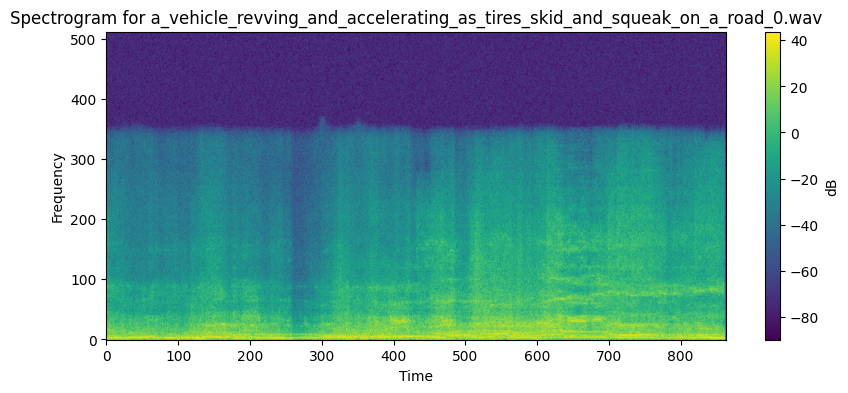

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_0.wav:


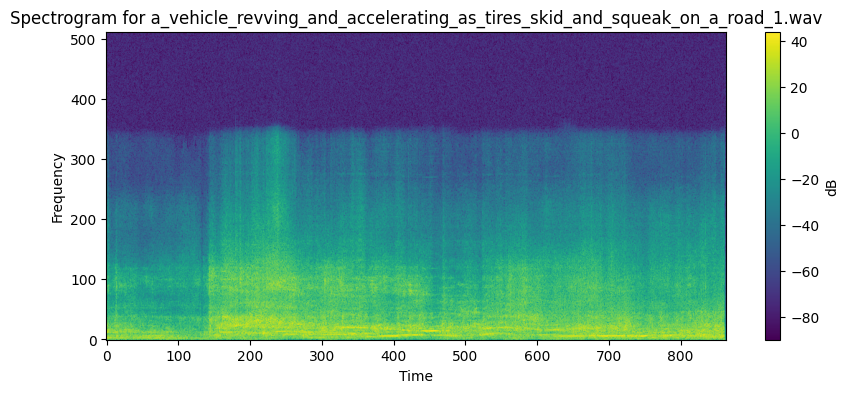

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_1.wav:


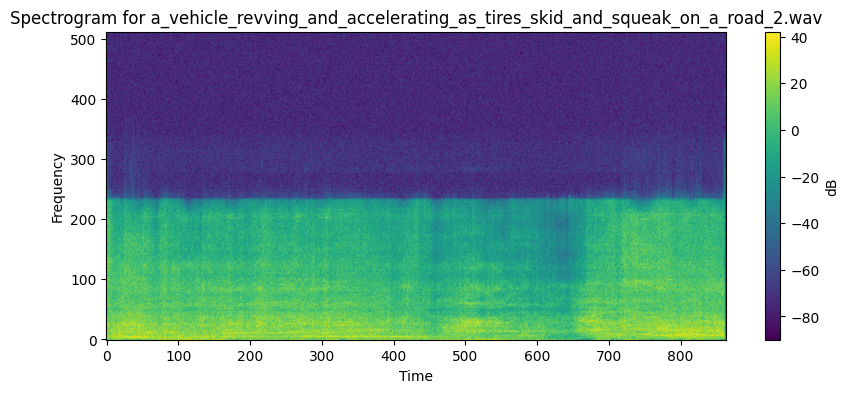

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_2.wav:


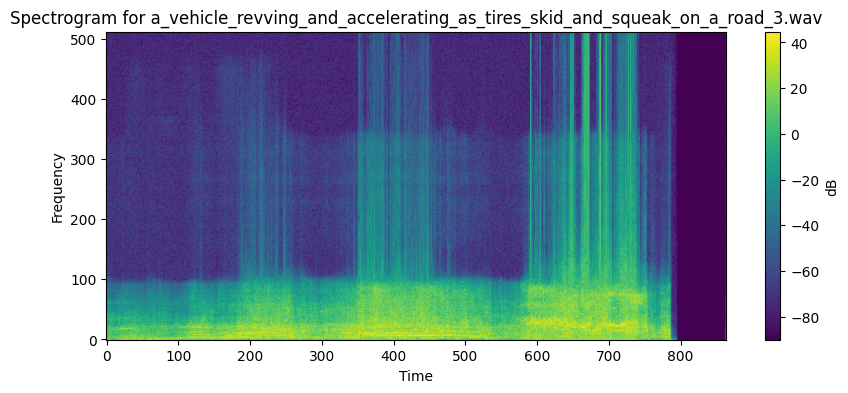

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_3.wav:


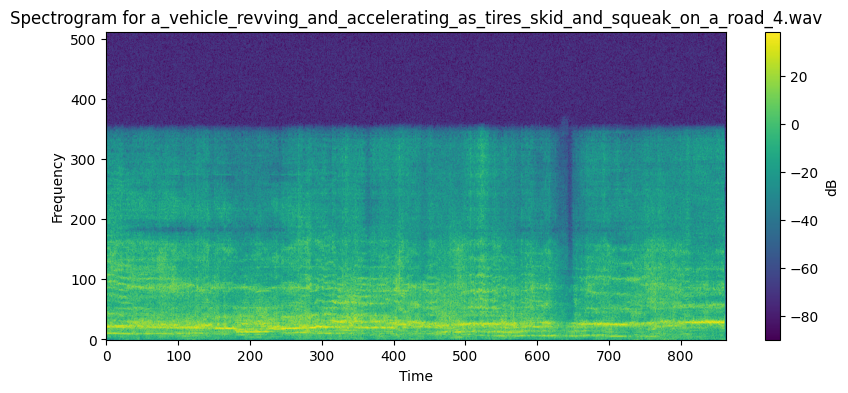

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_4.wav:


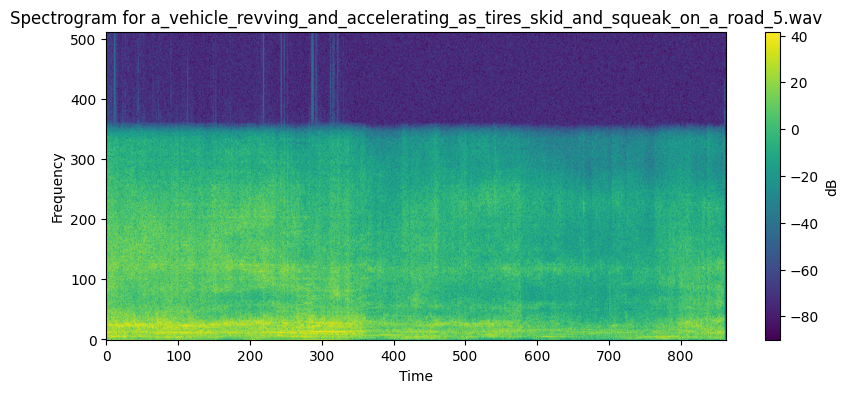

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_5.wav:


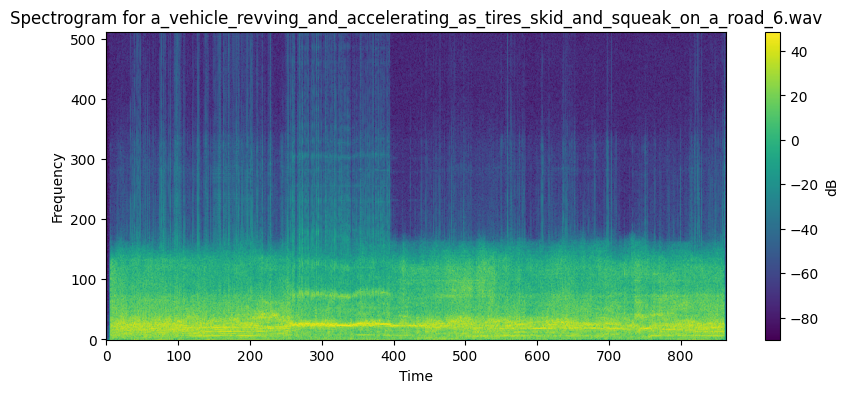

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_6.wav:


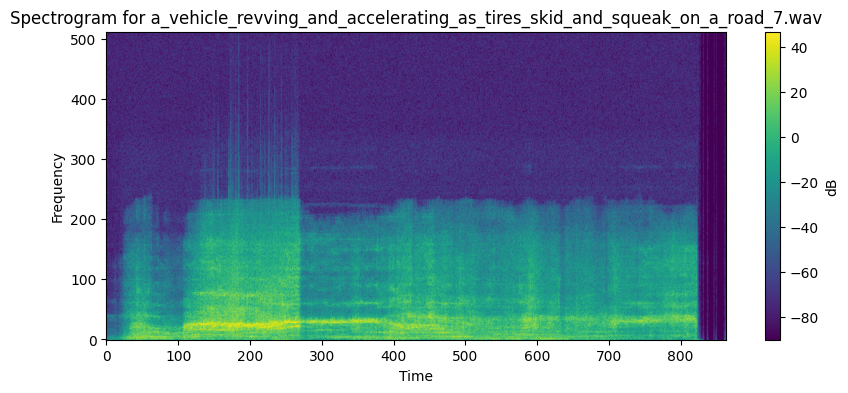

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_7.wav:


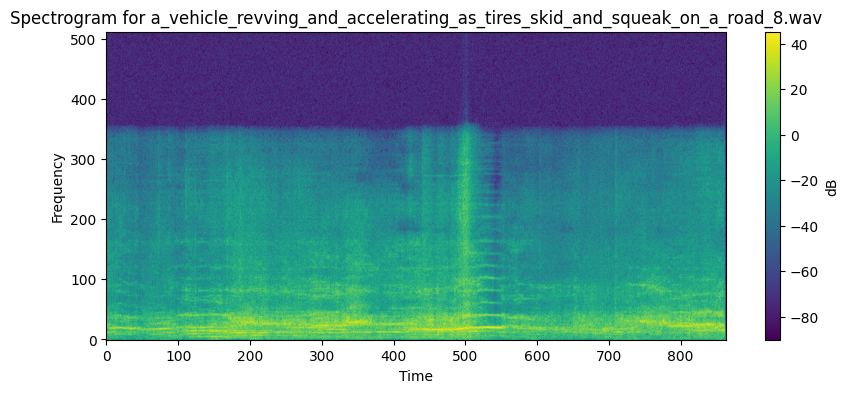

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_8.wav:


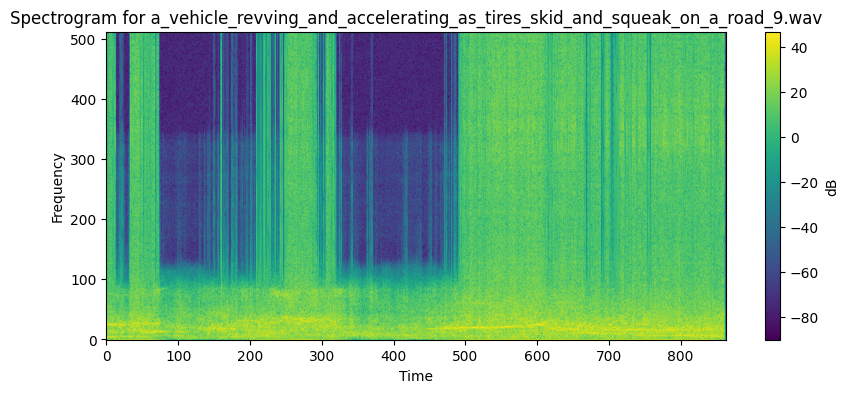

Audio playback for a_vehicle_revving_and_accelerating_as_tires_skid_and_squeak_on_a_road_9.wav:


In [63]:
wav_files = sorted(glob.glob(os.path.join(outdir, output_subdir, "*.wav")))
print("WAV files found in the output directory:")
for wf in wav_files:
    print("  ", wf)

# --- Display spectrograms and play audio for each WAV file ---
# Spectrogram transformation (adjust n_fft as needed)
spec_transform = torchaudio.transforms.Spectrogram(n_fft=1024)

for wav_file in wav_files:
    # Load the WAV file
    waveform, sample_rate = torchaudio.load(wav_file)
    
    # Compute the spectrogram and apply log transformation
    spec = spec_transform(waveform)
    spec_db = 10 * np.log10(spec.squeeze().numpy() + 1e-9)  # Add a small value to avoid division by zero
    
    # Plot the spectrogram
    plt.figure(figsize=(10, 4))
    plt.imshow(spec_db, origin="lower", aspect="auto", cmap="viridis")
    plt.title(f"Spectrogram for {os.path.basename(wav_file)}")
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar(label="dB")
    plt.show()
    
    # Display the audio playback widget
    print(f"Audio playback for {os.path.basename(wav_file)}:")
    display(Audio(wav_file))